# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

`При каждом запуске блокнота будут воспроизводиться одинаковые результаты`

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [3]:
df_train.sample(n=10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [4]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [5]:
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [6]:
print(df_test.isna().sum())
print()
print(df_train.isna().sum())

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64


>Пропуски присутствуют в следующих колонках:  
* mileage
* engine
* max_power
* torque
* seats

In [7]:
df_test.duplicated().sum()

62

In [8]:
df_train.duplicated().sum()

985

> В данных есть явные дубликаты: в датасете `df_test` - 62, `df_train` - 985

Построение дашбордов:

In [9]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q

  Preparing metadata (setup.py) ... done


In [10]:
from ydata_profiling import ProfileReport

profile_report_test = ProfileReport(df_test, title='Pandas Profiling Report for df_test')
profile_report_train = ProfileReport(df_train, title='Pandas Profiling Report for df_train')

In [11]:
profile_report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
profile_report_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

>Колонки с пропусками имеют текстовые значения, поэтому для начала необходимо порабоать с ними, а потом заменить пропуски на ср. значения. В задании №3 указано, что для простоты можно удалить колонку `torque`, пока удалять не будем,но и изменять тоже:

>Для колонок `mileage`, `engine`, `max_power` уберем единицы измерения и изменим тип данных на *float*:


In [13]:
import re

In [14]:
def change_type(df):

  change_columns = ['mileage', 'engine', 'max_power']

  def extract_number(value):
    match = re.search(r'\d+(?:\.\d+)?', str(value))
    return float(match.group()) if match else np.nan

  for column in change_columns:
    df[column] = df[column].apply(extract_number)

  return df

In [15]:
change_type(df_train)
change_type(df_test)

print(df_train.dtypes)
print()
print(df_test.dtypes)

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage          float64
engine           float64
max_power        float64
torque            object
seats            float64
dtype: object

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage          float64
engine           float64
max_power        float64
torque            object
seats            float64
dtype: object


In [16]:
import pickle

fill_columns = ['mileage', 'engine', 'max_power', 'seats']
medians = {}

for col in fill_columns:
    median_value = df_train[col].median()
    medians[col] = median_value
    df_train[col].fillna(median_value, inplace=True)
    df_test[col].fillna(median_value, inplace=True)

with open('median_values.pkl', 'wb') as file:
    pickle.dump(medians, file)

<ipython-input-16-3d85a059bc5c>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train[col].fillna(median_value, inplace=True)
<ipython-input-16-3d85a059bc5c>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usi

In [17]:
print(df_test.isna().sum())
print()
print(df_train.isna().sum())

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage           0
engine            0
max_power         0
torque           19
seats             0
dtype: int64

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage            0
engine             0
max_power          0
torque           203
seats              0
dtype: int64


### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [18]:
features = df_train.drop(columns='selling_price', axis=1)
cnt_dup = features.duplicated().sum()
print(f'{cnt_dup} - количество объектов с одинаковым признаковым описанием в df_train')

1159 - количество объектов с одинаковым признаковым описанием в df_train


In [19]:
# объекты с одинаковыми признаки вместе с ценой
duplicated_index = features.duplicated()
df_train[duplicated_index]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.90,1197.0,82.00,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,85.80,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.10,1197.0,85.80,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.60,1999.0,177.00,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487.0,214.56,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.00,995.0,62.00,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.40,1498.0,98.63,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59,1248.0,74.00,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,140Nm@ 1800-3000rpm,5.0


In [20]:
df_train = df_train.drop_duplicates(subset=features.columns, keep='first')
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6992,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.1Nm@ 3000rpm,5.0
6993,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90Nm@ 3500rpm,5.0
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [21]:
df_train = df_train.reset_index(drop=True)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [22]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

>Пункты 1 и 2 выполнены выше. Удалим колонку `torque`:

In [23]:
df_train.drop(columns='torque', axis=1, inplace=True)
df_test.drop(columns='torque', axis=1, inplace=True)

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [24]:
df_train['engine'] = df_train['engine'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)

df_train['seats'] = df_train['seats'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

In [25]:
print(df_train.dtypes)
print()
print(df_test.dtypes)

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage          float64
engine             int64
max_power        float64
seats              int64
dtype: object

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage          float64
engine             int64
max_power        float64
seats              int64
dtype: object


### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [26]:
df_train.describe(include=[int, float])

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.428611,1429.448973,87.910782,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.986026,485.662834,31.639585,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.300000,1248.000000,81.860000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [27]:
df_test.describe(include=[int, float])

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.337480,1454.87600,90.844330,5.403000
std,4.012149,7.585539e+05,48486.218662,3.951751,521.99574,34.892709,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.550000,1197.00000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.300000,1248.00000,82.425000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.300000,1582.00000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.00000,280.000000,9.000000


In [28]:
df_train.describe(include=[object])

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [29]:
df_test.describe(include=[object])

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [30]:
# заменила 13 на 12, т.к. мы удалили колонку torque
assert df_train.shape == (5840, 12)

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

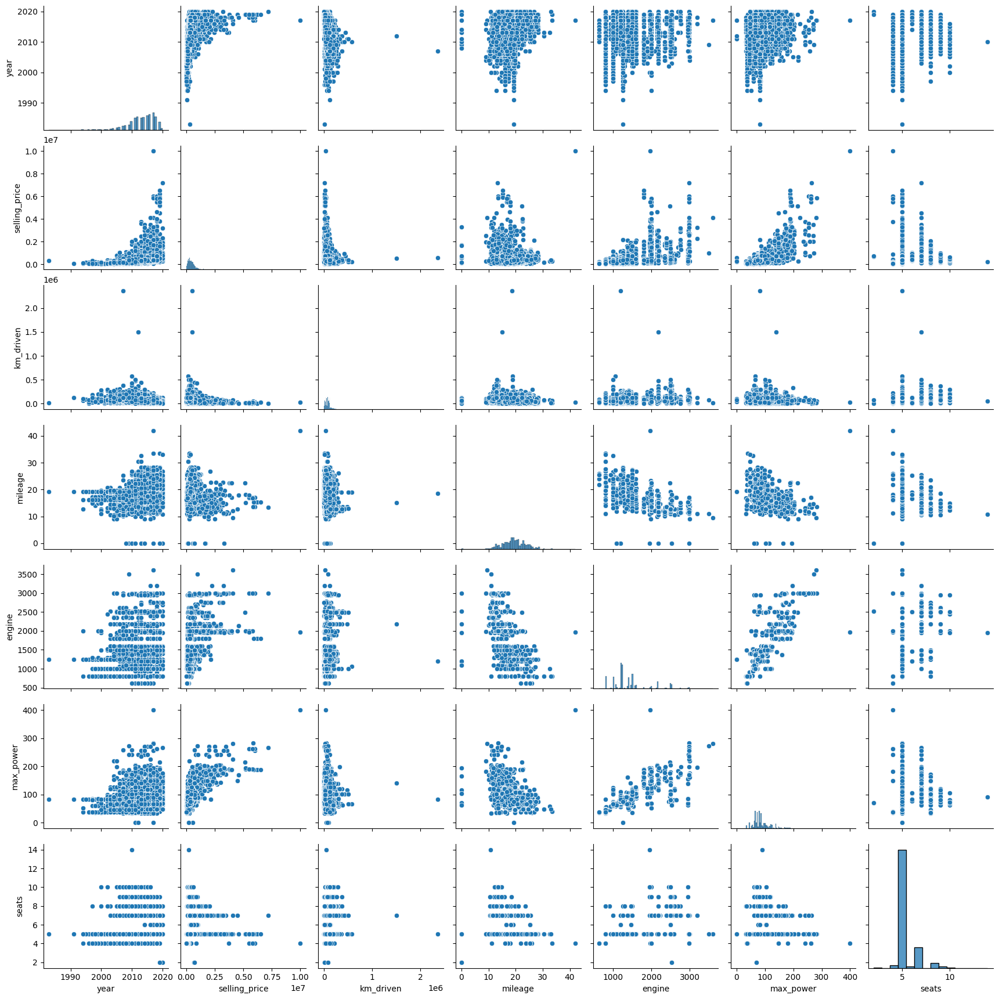

In [31]:
sns.pairplot(df_train)

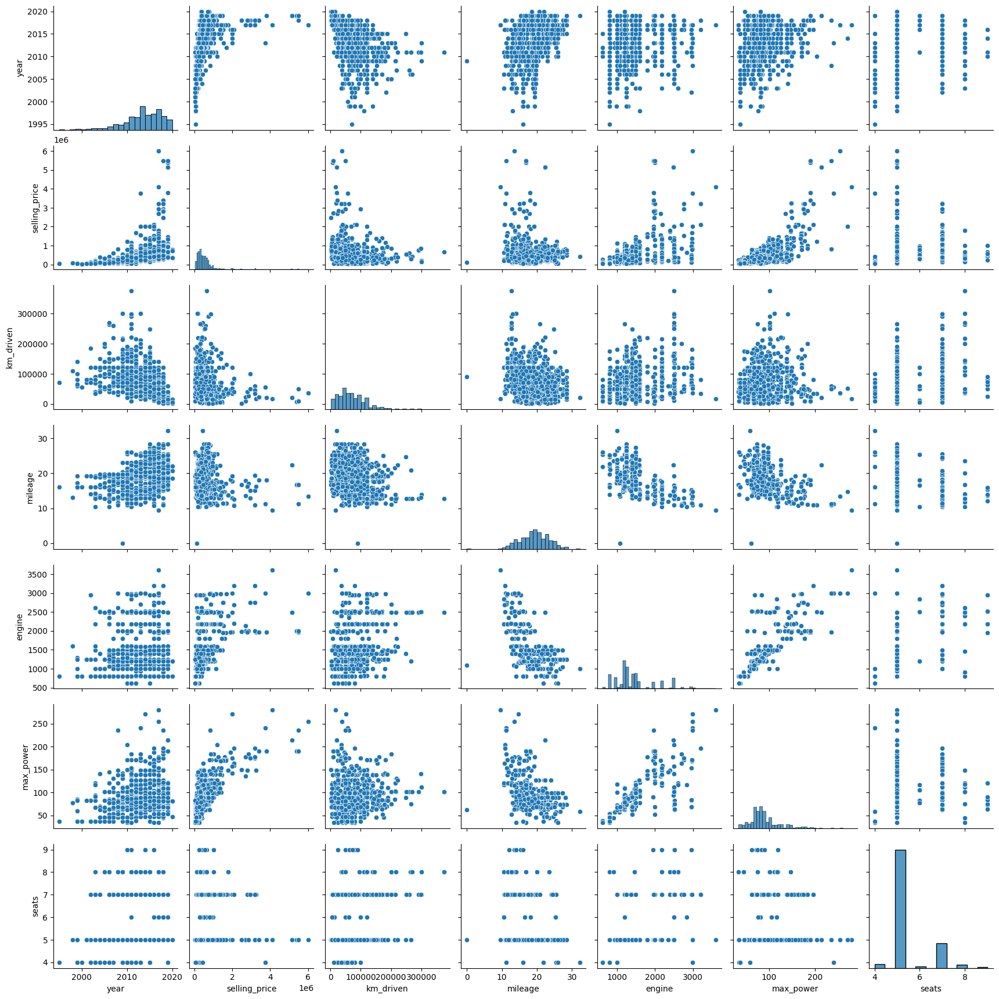

In [32]:
sns.pairplot(df_test)

`Шаг 1:`
* Наблюдается связь между целевой переменной(*selling_price*) и максимальной мощностью(*max_power*)
* Видна корреляция между признаками *max_power* и *engine*

`Шаг 2:`
* При разделении на трейн и тест совокупности оказались похожи


### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [33]:
corr_matrix = df_train.corr(numeric_only=True)
corr_matrix

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.000000,0.427279,-0.368966,0.342172,0.002819,0.156648,0.041178
selling_price,0.427279,1.000000,-0.164828,-0.104458,0.447672,0.692754,0.149953
km_driven,-0.368966,-0.164828,1.000000,-0.182245,0.229766,0.024630,0.192328
mileage,0.342172,-0.104458,-0.182245,1.000000,-0.572677,-0.373271,-0.450810
engine,0.002819,0.447672,0.229766,-0.572677,1.000000,0.681082,0.652172
max_power,0.156648,0.692754,0.024630,-0.373271,0.681082,1.000000,0.244060
seats,0.041178,0.149953,0.192328,-0.450810,0.652172,0.244060,1.000000


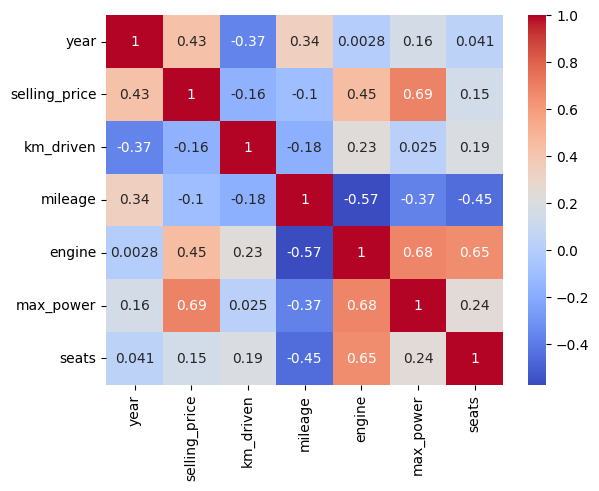

In [34]:
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`Ответ`
* Признаки *max_power* и *year* имеют самую слабую корреляцию. Если говорить про признак, который меньше всего коррелирует с целевой переменной - это *seats*
* Сильная положительная линейная зависимость наблюдается между признаками *max_power* и *engine*, *seats* и *engine*. Признак *max_power*, также, имеет сильную корреляцию с целевой переменной.
* По матрице корреляций видна отрицательная корреляция между годом(*year*) и пробегом(*km_driven*). Это означает, что с увеличением значения одного признака, другой - уменьшается. Поэтому, мы можем утверждать, что чем меньше год (чем старее машина), тем больше киллометров она проехала

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

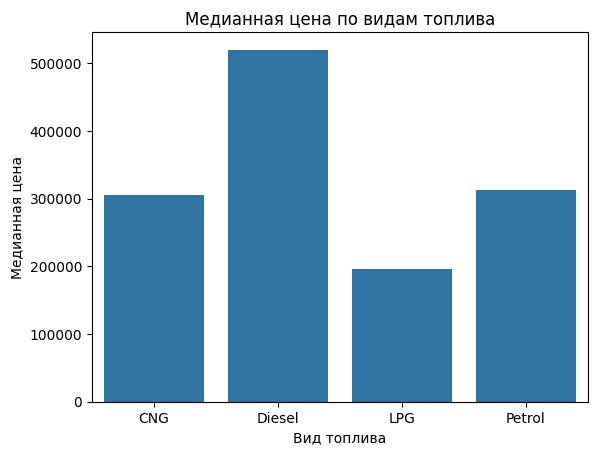

In [35]:
median_prices = df_train.groupby('fuel')['selling_price'].median().reset_index()

sns.barplot(x='fuel', y='selling_price', data=median_prices)

plt.title('Медианная цена по видам топлива')
plt.xlabel('Вид топлива')
plt.ylabel('Медианная цена')
plt.show()

>По графику видно, что выше всего медианная цена у машин с типов топлива *Diesel*, ниже всего - с типом *LPG*

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [36]:
df_train_copy = df_train.copy()
df_train_copy.drop(columns=['name', 'fuel', 'seller_type', 'transmission', 'owner'], inplace=True)
df_train_copy.head()

,year,selling_price,km_driven,mileage,engine,max_power,seats
0,2014,450000,145500,23.40,1248,74.00,5
1,2014,370000,120000,21.14,1498,103.52,5
2,2010,225000,127000,23.00,1396,90.00,5
3,2007,130000,120000,16.10,1298,88.20,5
4,2017,440000,45000,20.14,1197,81.86,5


In [37]:
df_test_copy = df_test.copy()
df_test_copy.drop(columns=['name', 'fuel', 'seller_type', 'transmission', 'owner'], inplace=True)
df_test_copy.head()

,year,selling_price,km_driven,mileage,engine,max_power,seats
0,2010,229999,168000,14.0,2498,112.0,7
1,2017,665000,25000,21.5,1497,108.5,5
2,2007,175000,218463,12.9,1799,130.0,5
3,2015,635000,173000,25.1,1498,98.6,5
4,2011,130000,70000,16.5,1172,65.0,5


In [38]:
y_train = df_train_copy['selling_price']
X_train = df_train_copy.drop(columns='selling_price', axis=1)

In [39]:
assert X_train.shape == (5840, 6)

In [40]:
y_test = df_test_copy['selling_price']
X_test = df_test_copy.drop(columns='selling_price', axis=1)

In [41]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [42]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model_lr = LinearRegression()
model_lr.fit(X_train, y_train)

y_pred_train = model_lr.predict(X_train)
y_pred_test_lr = model_lr.predict(X_test)

print('MSE_train:', np.round(MSE(y_train, y_pred_train), 2))
print('MSE_test:', np.round(MSE(y_test, y_pred_test_lr), 2))
print()
print('R2_train:', np.round(r2_score(y_train, y_pred_train), 2))
print('R2_test:', np.round(r2_score(y_test, y_pred_test_lr), 2))

MSE_train: 116873067751.52
MSE_test: 233297548204.61

R2_train: 0.59
R2_test: 0.59


> Значение MSE на тестовых данных почти вдвое превышает значение на трейне, это может говорить о переобучении модели. Одинаковое значение (достаточно неплохое) метрики R2 говорит о том, что модель в принципе рабоатет неплохо и улавливаят закономерности в данных

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [43]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [44]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns = X_train.columns)
X_train_scaled.head()

,year,km_driven,mileage,engine,max_power,seats
0,0.139570,1.191152,0.996413,-0.373643,-0.439701,-0.434419
1,0.139570,0.766619,0.429384,0.141162,0.493387,-0.434419
2,-0.837167,0.883158,0.896054,-0.068879,0.066037,-0.434419
3,-1.569719,0.766619,-0.835142,-0.270682,0.009142,-0.434419
4,0.872122,-0.482007,0.178486,-0.478663,-0.191257,-0.434419


In [45]:
X_test_scaled = pd.DataFrame(X_test_scaled, columns = X_test.columns)
X_test_scaled.head()

,year,km_driven,mileage,engine,max_power,seats
0,-0.837167,1.565740,-1.362027,2.200379,0.761428,1.601702
1,0.872122,-0.814974,0.519707,0.139102,0.650798,-0.434419
2,-1.569719,2.405866,-1.638015,0.760986,1.330385,-0.434419
3,0.383754,1.648982,1.422940,0.141162,0.337872,-0.434419
4,-0.592983,-0.065798,-0.734782,-0.530144,-0.724180,-0.434419


In [46]:
model_lr.fit(X_train_scaled, y_train)

y_pred_train = model_lr.predict(X_train_scaled)
y_pred_test_scaled = model_lr.predict(X_test_scaled)

print('MSE_train_scaled:', np.round(MSE(y_train, y_pred_train), 2))
print('MSE_test_scaled:', np.round(MSE(y_test, y_pred_test_scaled), 2))
print()
print('R2_train_scaled:', np.round(r2_score(y_train, y_pred_train), 2))
print('R2_test_scaled:', np.round(r2_score(y_test, y_pred_test_scaled), 2))

MSE_train_scaled: 116873067751.52
MSE_test_scaled: 233297548204.6

R2_train_scaled: 0.59
R2_test_scaled: 0.59


### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [47]:
coff = model_lr.coef_
coff

array([152843.26235772, -44148.04751104,  28781.08659475,  61176.85714999,
       322779.70323584, -23220.5702262 ])

In [48]:
max_index = np.argmax(np.abs(coff))
feature_names = X_train.columns
feature_names[max_index]

'max_power'

>Наиболее информативным в предсказании цены яляется признак *max_power*

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [49]:
from sklearn.linear_model import Lasso

model_lasso = Lasso()
model_lasso.fit(X_train_scaled, y_train)

y_pred_train = model_lasso.predict(X_train_scaled)
y_pred_test_lasso = model_lasso.predict(X_test_scaled)

print('MSE_train_scaled:', np.round(MSE(y_train, y_pred_train), 2))
print('MSE_test_scaled:', np.round(MSE(y_test, y_pred_test_lasso), 2))
print()
print('R2_train_scaled:', np.round(r2_score(y_train, y_pred_train), 2))
print('R2_test_scaled:', np.round(r2_score(y_test, y_pred_test_lasso), 2))

MSE_train_scaled: 116873067761.64
MSE_test_scaled: 233298219170.76

R2_train_scaled: 0.59
R2_test_scaled: 0.59


>Качество модели не сильно, но ухудшилось

In [50]:
 model_lasso.coef_

array([152843.08385345, -44146.91853785,  28779.20408499,  61172.02578008,
       322780.58619708, -23217.69327311])

>L1-регуляризация с параметрами по умолчанию не занулила веса, это связано с маленьким значением alpha и огромными значениями весов. Попробуем увеличить значение alpha и посмотрим что будет:

In [51]:
model_lasso = Lasso(alpha=100000)
model_lasso.fit(X_train_scaled, y_train)

y_pred_train = model_lasso.predict(X_train_scaled)
y_pred_test_lasso = model_lasso.predict(X_test_scaled)

print('MSE_train_scaled:', np.round(MSE(y_train, y_pred_train), 2))
print('MSE_test_scaled:', np.round(MSE(y_test, y_pred_test_lasso), 2))
print()
print('R2_train_scaled:', np.round(r2_score(y_train, y_pred_train), 2))
print('R2_test_scaled:', np.round(r2_score(y_test, y_pred_test_lasso), 2))

MSE_train_scaled: 136511959234.43
MSE_test_scaled: 300826523465.66

R2_train_scaled: 0.52
R2_test_scaled: 0.48


In [52]:
model_lasso.coef_

array([ 88496.63066295,     -0.        ,      0.        ,      0.        ,
       257028.21276812,      0.        ])

>При alpha=100000 занулились все коэффиценты при признаках, кроме *year* и *max_power*

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [53]:
from sklearn.model_selection import GridSearchCV

model_lasso = Lasso()
param_grid = {'alpha': np.logspace(np.log10(10000), np.log10(100000), num=20)}
grid_search = GridSearchCV(estimator=model_lasso, param_grid=param_grid, cv=10, n_jobs=-1)

grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([ 10000.        ,  11288.37891685,  12742.74985703,  14384.49888288,
        16237.76739189,  18329.80710832,  20691.38081115,  23357.2146909 ,
        26366.5089873 ,  29763.51441631,  33598.18286284,  37926.90190732,
        42813.32398719,  48329.30238572,  54555.94781169,  61584.8211066 ,
        69519.27961776,  78475.99703515,  88586.67904101, 100000.        ])})

In [54]:
# лучший параметр alpha
grid_search.best_params_

{'alpha': 26366.508987303554}

In [55]:
best_model = grid_search.best_estimator_

In [56]:
y_pred_train = best_model.predict(X_train_scaled)
y_pred_lasso_gs = best_model.predict(X_test_scaled)

print('MSE_train:', np.round(MSE(y_train, y_pred_train), 2))
print('MSE_test:', np.round(MSE(y_test, y_pred_lasso_gs), 2))
print()
print('R2_train', np.round(r2_score(y_train, y_pred_train), 2))
print('R2_test', np.round(r2_score(y_test, y_pred_lasso_gs), 2))

MSE_train: 119616267120.66
MSE_test: 250178999408.95

R2_train 0.58
R2_test 0.56


> * Всего было обучено 20 * 10 = 200 моделей
* Лучший коэффицент alpha = 26366.508987303554. При данном значении занулились некотрые из коэффицентов. Не занулились коэфф. при признаках *year*, *km_driven* и *max_power* -> можно сделать вывод, что данные признаки наболее важные для модели.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [57]:
from sklearn.linear_model import ElasticNet

model_en = ElasticNet()

param_grid = {
    'alpha': np.logspace(np.log10(10000), np.log10(100000), num=20),
    'l1_ratio': np.linspace(0, 1, num=11)
}

grid_search = GridSearchCV(estimator=model_en, param_grid=param_grid, cv=10, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': array([ 10000.        ,  11288.37891685,  12742.74985703,  14384.49888288,
        16237.76739189,  18329.80710832,  20691.38081115,  23357.2146909 ,
        26366.5089873 ,  29763.51441631,  33598.18286284,  37926.90190732,
        42813.32398719,  48329.30238572,  54555.94781169,  61584.8211066 ,
        69519.27961776,  78475.99703515,  88586.67904101, 100000.        ]),
                         'l1_ratio': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])})

In [58]:
grid_search.best_estimator_

ElasticNet(alpha=26366.508987303554, l1_ratio=1.0)

In [59]:
best_model = grid_search.best_estimator_

In [60]:
y_pred_train = best_model.predict(X_train_scaled)
y_pred_en_gs = best_model.predict(X_test_scaled)

print('MSE_train:', np.round(MSE(y_train, y_pred_train), 2))
print('MSE_test:', np.round(MSE(y_test, y_pred_en_gs), 2))
print()
print('R2_train', np.round(r2_score(y_train, y_pred_train), 2))
print('R2_test', np.round(r2_score(y_test, y_pred_en_gs), 2))

MSE_train: 119616267120.66
MSE_test: 250178999408.95

R2_train 0.58
R2_test 0.56


> * Всего грид-сёрч обучл 20 * 11 * 10 = 2200 моделей
* Для лучшей модели гиперпараметры следующие: alpha=26366.508987303554,  l1_ratio=1.0(получается, что в данном случае работает лучше всего L1-регуляризация)

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [61]:
df_train_2 = df_train.copy()
df_test_2 = df_test.copy()

In [62]:
df_train_2.drop(columns='name', inplace=True)
df_test_2.drop(columns='name', inplace=True)

In [63]:
df_train_2.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5
2,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
3,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5
4,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5


In [64]:
df_test_2.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0,2498,112.0,7
1,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5,1497,108.5,5
2,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9,1799,130.0,5
3,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1,1498,98.6,5
4,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5,1172,65.0,5


В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [65]:
# assert X_train_cat.shape == (5840, 10)

In [66]:
# X_train_cat.describe(include='object')

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [67]:
from sklearn.preprocessing import OneHotEncoder

categorical_features = ['fuel', 'seller_type', 'transmission', 'owner', 'seats']

onehotencoder = OneHotEncoder(drop='first', handle_unknown='ignore')

encoded_data = onehotencoder.fit_transform(df_train_2[categorical_features])
encoded_df = pd.DataFrame(encoded_data.toarray(), columns=onehotencoder.get_feature_names_out())

df_train_2 = df_train_2.join(encoded_df)
df_train_2.drop(categorical_features, axis=1, inplace=True)

In [68]:
with open('onehotencoder.pkl', 'wb') as file:
    pickle.dump(onehotencoder, file)

In [69]:
test_encoded_data = onehotencoder.transform(df_test_2[categorical_features])
test_encoded_df = pd.DataFrame(test_encoded_data.toarray(), columns=onehotencoder.get_feature_names_out())

df_test_2 = df_test_2.join(test_encoded_df)

df_test_2.drop(categorical_features, axis=1, inplace=True)

In [70]:
df_train_2.head()

,year,selling_price,km_driven,mileage,engine,max_power,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,2014,450000,145500,23.40,1248,74.00,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2014,370000,120000,21.14,1498,103.52,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2010,225000,127000,23.00,1396,90.00,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2007,130000,120000,16.10,1298,88.20,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2017,440000,45000,20.14,1197,81.86,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
df_test_2.head()

,year,selling_price,km_driven,mileage,engine,max_power,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,2010,229999,168000,14.0,2498,112.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2017,665000,25000,21.5,1497,108.5,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2007,175000,218463,12.9,1799,130.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2015,635000,173000,25.1,1498,98.6,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2011,130000,70000,16.5,1172,65.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [72]:
y_train_2 = df_train_2['selling_price']
X_train_2 = df_train_2.drop(columns='selling_price', axis=1)

y_test_2 = df_test_2['selling_price']
X_test_2 = df_test_2.drop(columns='selling_price', axis=1)

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [73]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

model_r = Ridge()
alphas = [0.01, 0.05, 0.1, 0.5, 1.0, 5.0, 10.0]
param_grid = {'alpha': alphas}
grid_search = GridSearchCV(estimator=model_r, param_grid=param_grid, scoring='r2', cv=10)

grid_search.fit(X_train_2, y_train_2)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.01, 0.05, 0.1, 0.5, 1.0, 5.0, 10.0]},
             scoring='r2')

In [74]:
grid_search.best_score_

0.6218799568944144

In [75]:
grid_search.best_params_

{'alpha': 5.0}

In [76]:
best_model = grid_search.best_estimator_

In [77]:
y_pred_train = best_model.predict(X_train_2)
y_pred_ridge = best_model.predict(X_test_2)

print('MSE_train:', np.round(MSE(y_train_2, y_pred_train), 2))
print('MSE_test:', np.round(MSE(y_test_2, y_pred_ridge), 2))
print()
print('R2_train', np.round(r2_score(y_train_2, y_pred_train), 2))
print('R2_test', np.round(r2_score(y_test_2, y_pred_ridge), 2))

MSE_train: 97700680209.65
MSE_test: 205096124953.69

R2_train 0.66
R2_test 0.64


In [78]:
from joblib import dump
dump(best_model, 'ridge_model.joblib')

['ridge_model.joblib']

>Удалось улучшить качество прогноза. Ранее R2 было равно максимум 0.59, сейчас - 0.64. Значение MSE также улучшилось.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [79]:
def business_metric(y_true, y_pred):
    relative_errors = np.abs((y_pred - y_true) / y_true)
    correct_predictions = np.sum(relative_errors <= 0.1)

    return correct_predictions / len(y_true)

lr_score = business_metric(y_test, y_pred_test_lr)
scaled_score = business_metric(y_test, y_pred_test_scaled)
lasso_score = business_metric(y_test, y_pred_test_lasso)
lasso_gs_score = business_metric(y_test, y_pred_lasso_gs)
en_gs_score = business_metric(y_test, y_pred_en_gs)
ridge_score = business_metric(y_test, y_pred_ridge) # данные, к котрым применили OHE

print(f'LR score: {lr_score:.4f}')
print(f'Scaled score: {scaled_score:.4f}')
print(f'Lasso score: {lasso_score:.4f}')
print(f'Lasso GS score: {lasso_gs_score:.4f}')
print(f'EN GS score: {en_gs_score:.4f}')
print(f'Ridge score: {ridge_score:.4f}')

LR score: 0.2270
Scaled score: 0.2270
Lasso score: 0.2450
Lasso GS score: 0.2330
EN GS score: 0.2330
Ridge score: 0.2470


`Лучше всего задачу решает модель Ridge`